# Satellite Image Data Cleaning

## Imports and Setup

In [1]:
import pandas as pd
import geopandas as gpd

import os 
os.chdir('../')
from utils import visual_utils
from utils import config_utils

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

%load_ext autoreload
%autoreload 2

/anaconda/envs/gigav3/lib/python3.10/site-packages/torch/cuda/__init__.py:138: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11040). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


## Data Configuration

In [2]:
iso_code = "TJK"
config_file = os.path.join(os.getcwd(), 'configs/sat_configs/sat_config_500x500_60cm.yaml')
config = config_utils.load_config(config_file)

## Run Pre-trained Model

In [3]:
model_iso_code = "MNG"
model_config_file = os.path.join(os.getcwd(), "configs/best_models.yaml")
model_configs = config_utils.create_config(model_config_file)

data = visual_utils.generate_predictions(iso_code, model_iso_code, model_configs)
data.head(3)

,UID,source,iso,country,region,subregion,name,giga_id_school,clean,prob,validated,geometry
0,UNICEF-TJK-SCHOOL-00000000,UNICEF,TJK,Tajikistan,Asia,Central Asia,None,0,0,0.924836,0,POINT (71.49821 37.95492)
1,UNICEF-TJK-SCHOOL-00000004,UNICEF,TJK,Tajikistan,Asia,Central Asia,None,4,0,0.457308,0,POINT (71.56139 37.94580)
2,UNICEF-TJK-SCHOOL-00000005,UNICEF,TJK,Tajikistan,Asia,Central Asia,None,5,0,0.908034,0,POINT (71.55055 37.94814)


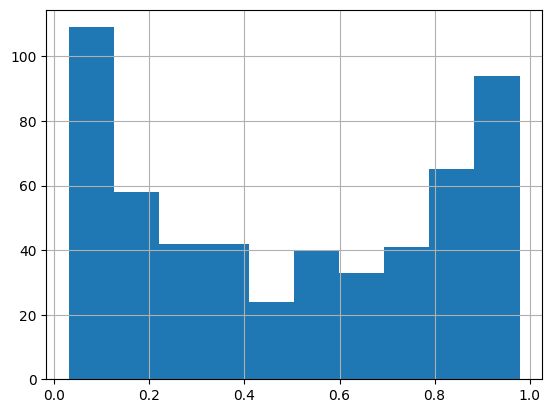

In [4]:
data['prob'].hist();

## Visualize Images

INFO:root:Data dimensions: (483, 12)


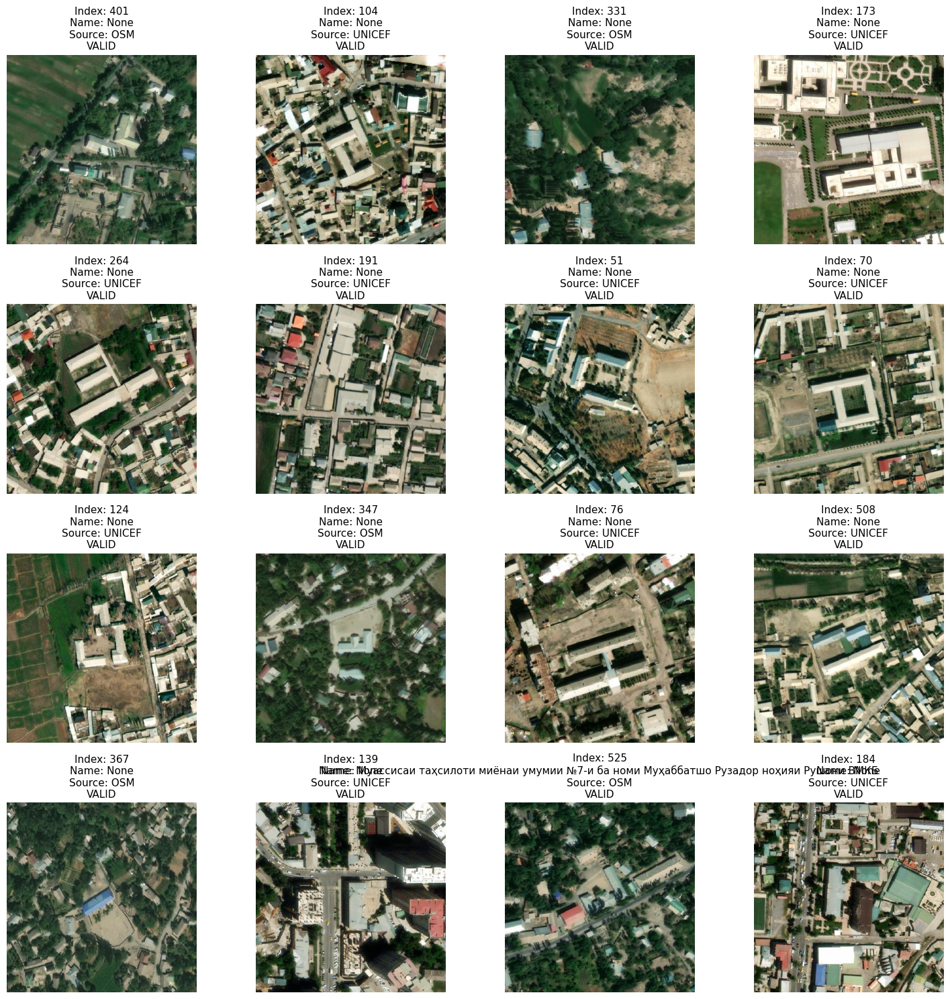

In [12]:
visual_utils.inspect_images(
    config, 
    iso_code=iso_code, 
    category="school", 
    start_index=16*5, 
    random=True, 
    min_prob=0,
    max_prob=1,
    suffix="_prob"
)

INFO:root:Data dimensions: (966, 11)


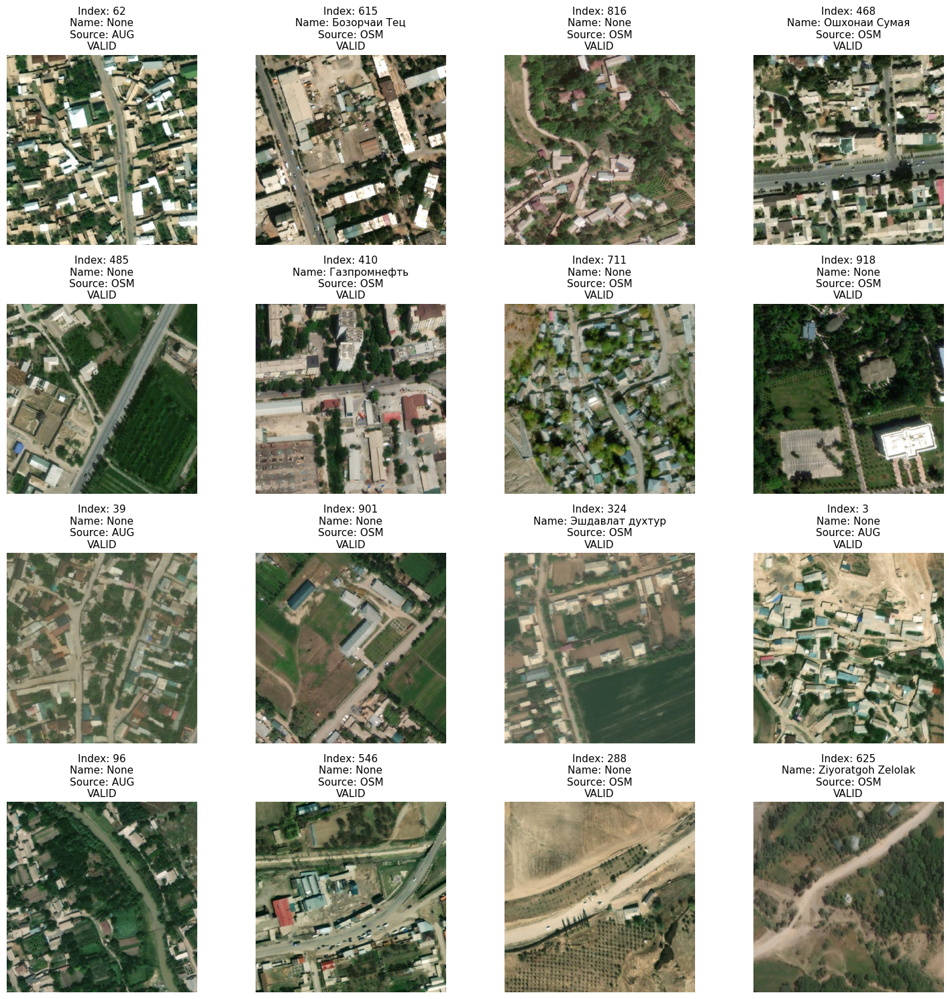

In [13]:
visual_utils.inspect_images(config, iso_code, category="non_school", start_index=16*10, random=True, suffix="")

## Inspect Points

In [8]:
index = 469
visual_utils.map_coordinates(config, index, category="school", iso_code=iso_code)

INFO:root:OVERTURE-TJK-SCHOOL-00000048
INFO:root:Ср. школа 6, Ёгед
INFO:root:Cf. School 6, fucking


## Data Validation

In [137]:
visual_utils.update_validation(
    config, iso_code=iso_code, category="school", 
    indexes=[]
)

INFO:root:Item 234 changed to INVALID.


INFO:root:Data dimensions: (42, 12)


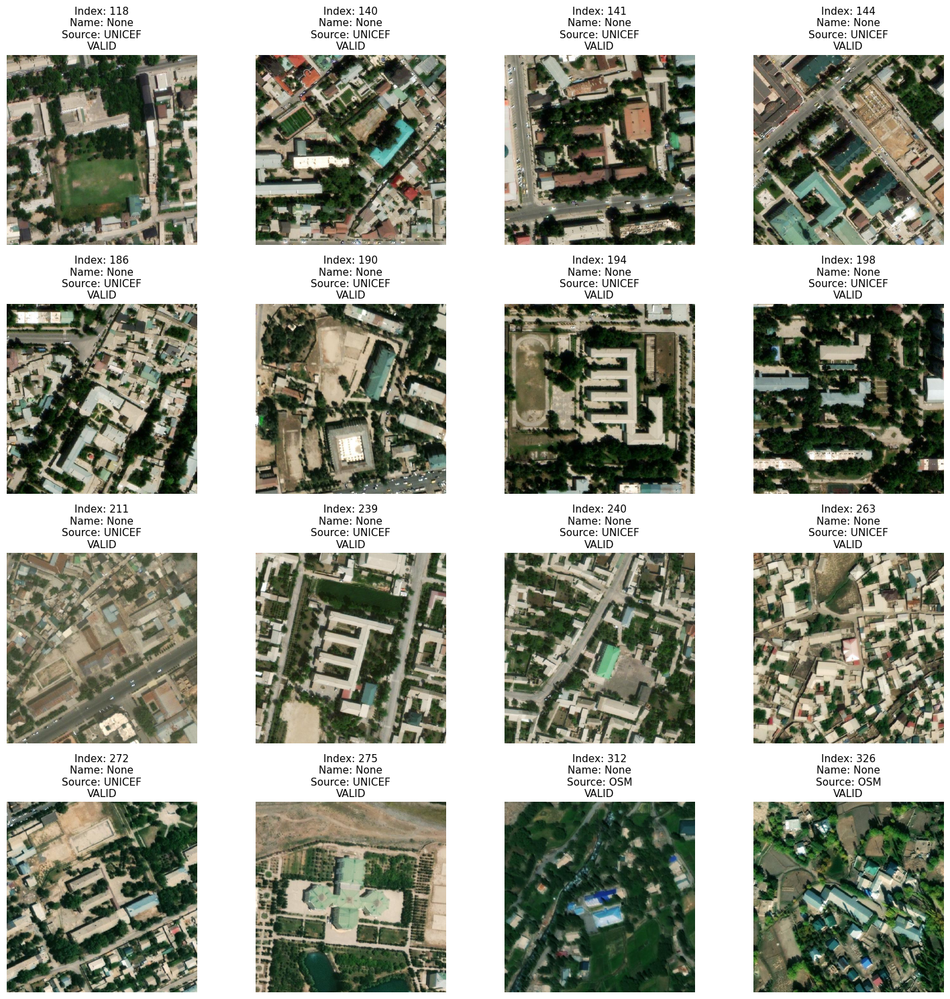

In [9]:
visual_utils.inspect_images(
    config, 
    iso_code=iso_code, 
    category="school", 
    start_index=16*1, 
    random=False, 
    show_validated=True,
    min_prob=0.5,
    max_prob=0.6,
)

In [10]:
visual_utils.validate_data(
    config, 
    iso_code, 
    category="school", 
    start_index=16*0, 
    show_validated=True,
    min_prob=0,
    max_prob=0.1
)